# Zeta prediciton for Pluralsight

## Load and Organize Data

First let's import the usual data science modules!

In [1]:
from sklearn import datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

%matplotlib inline
sns.set_context('notebook')
sns.set_style('whitegrid')
sns.set_palette('Blues_r')

In [2]:
from dataprep.eda import create_report
from dataprep.eda.missing import plot_missing

In [3]:
df1 = pd.read_excel("recruiting_zeta-disease_training-data_take-home-challenge.xlsx", sheet_name='2021_zeta-disease_training-data')

In [4]:
df1.head()

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
0,54,189,27.1,80,0,1.5038,0,10,0
1,23,150,38.5,68,71,0.3868,55,2,0
2,47,186,29.9,90,0,0.2728,0,7,0
3,18,150,30.8,70,1033,0.6598,56,0,0
4,24,160,32.4,74,125,0.7608,59,2,0


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 800 non-null    int64  
 1   weight              800 non-null    int64  
 2   bmi                 800 non-null    float64
 3   blood_pressure      800 non-null    int64  
 4   insulin_test        800 non-null    int64  
 5   liver_stress_test   800 non-null    float64
 6   cardio_stress_test  800 non-null    int64  
 7   years_smoking       800 non-null    int64  
 8   zeta_disease        800 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 56.4 KB


### Missing Values
There appear to be no missing values.

In [6]:
df1.describe()

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,30.985000,172.407500,32.201625,69.565000,85.887500,0.544496,43.121250,4.051250,0.348750
std,13.824025,31.942438,8.549155,19.874784,126.333656,0.348711,30.409949,4.176173,0.476873
min,18.000000,94.000000,0.000000,0.000000,0.000000,0.140800,0.000000,0.000000,0.000000
25%,21.000000,149.000000,27.300000,62.000000,0.000000,0.307800,0.000000,1.000000,0.000000
50%,26.000000,167.000000,32.050000,72.000000,45.000000,0.445300,53.000000,3.000000,0.000000
75%,38.000000,192.000000,36.525000,80.000000,130.000000,0.699800,62.000000,6.000000,1.000000
max,109.000000,308.000000,86.100000,157.000000,1077.000000,3.481300,214.000000,40.000000,1.000000


In [7]:
df1.zeta_disease.value_counts()

zeta_disease
0    521
1    279
Name: count, dtype: int64

### Check Data Distributions
Use the loop below to plot hist. There aren't any categorical columns in this data, so there will be no countplots.

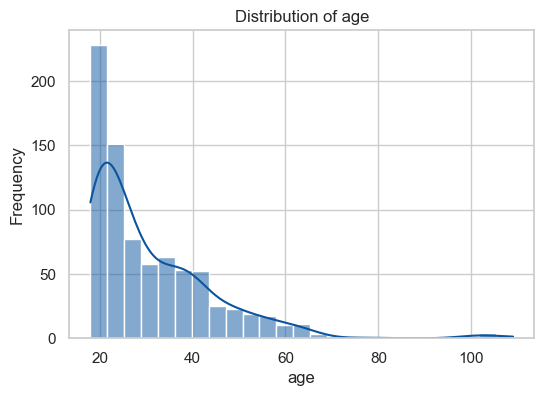

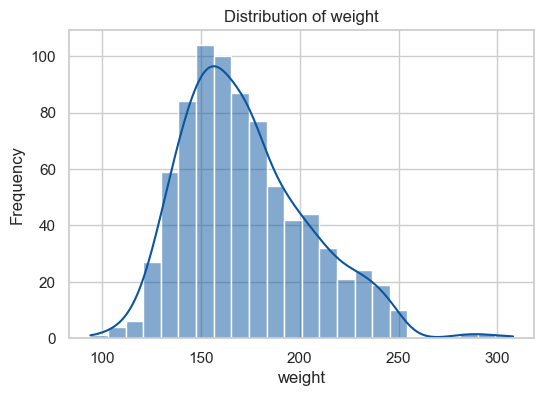

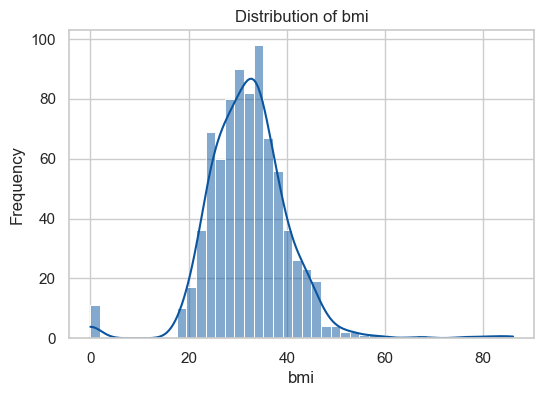

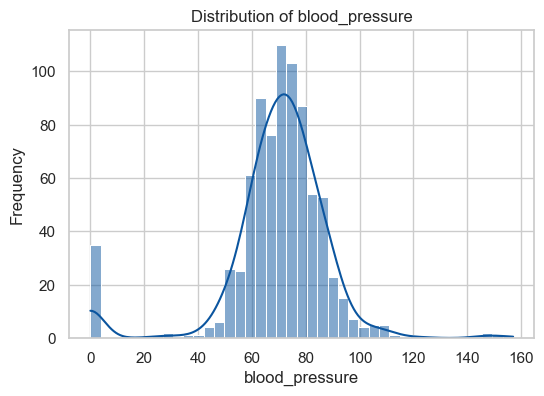

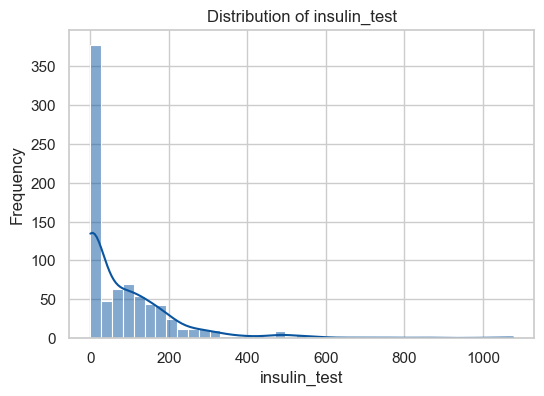

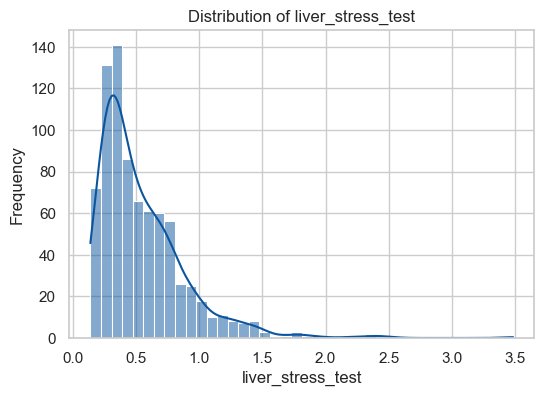

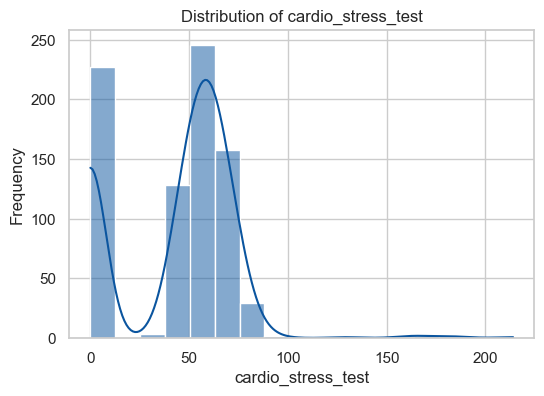

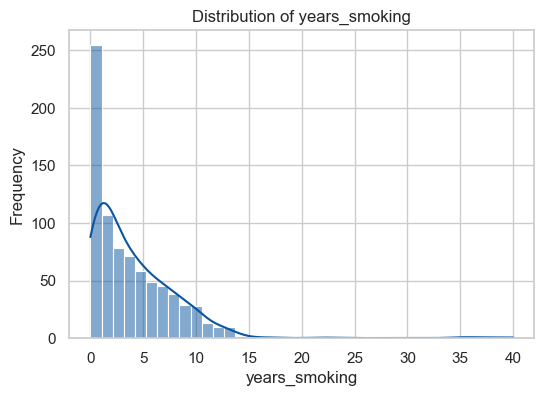

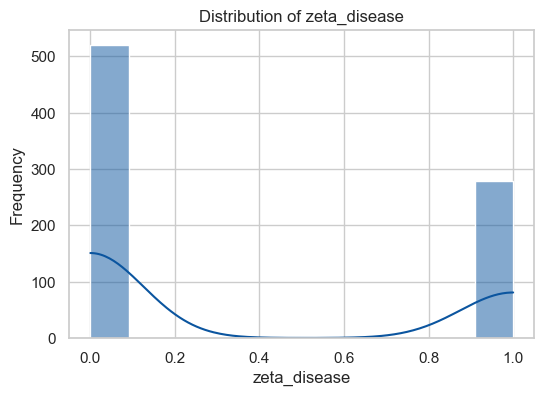

In [8]:
for column in df1.columns:
    plt.figure(figsize=(6, 4))
    if pd.api.types.is_numeric_dtype(df1[column]):
        sns.histplot(df1[column], kde=True)
        plt.title(f'Distribution of {column}')
    else:
        sns.countplot(x=df[column])
        plt.title(f'Count plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

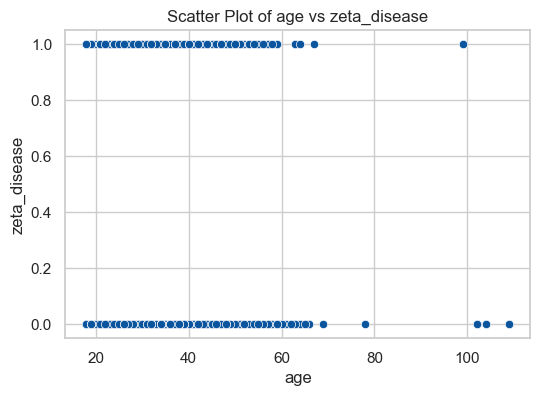

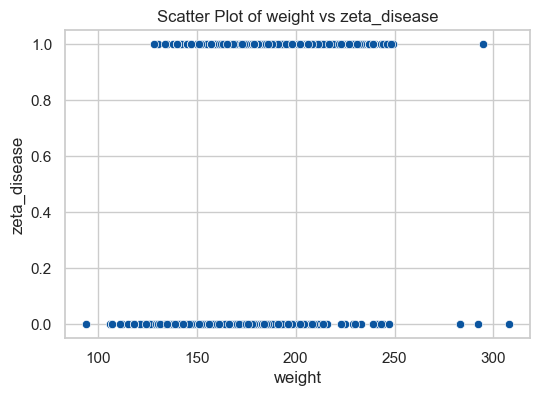

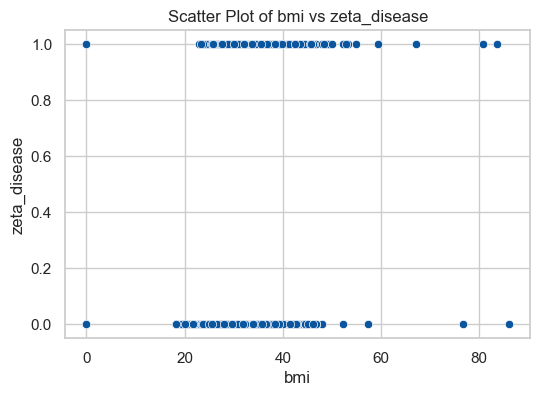

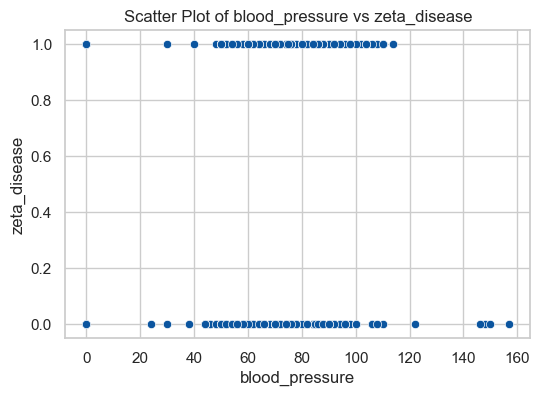

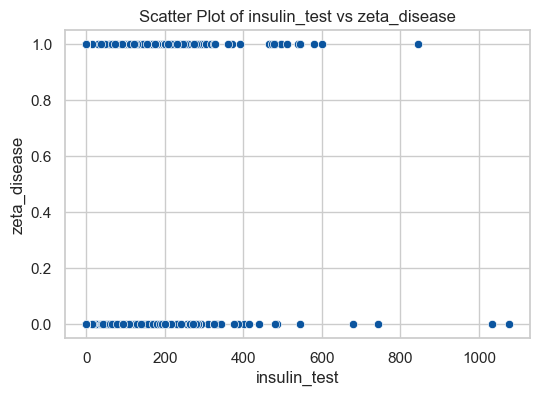

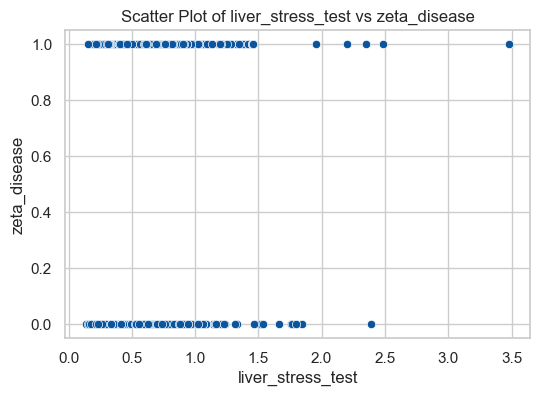

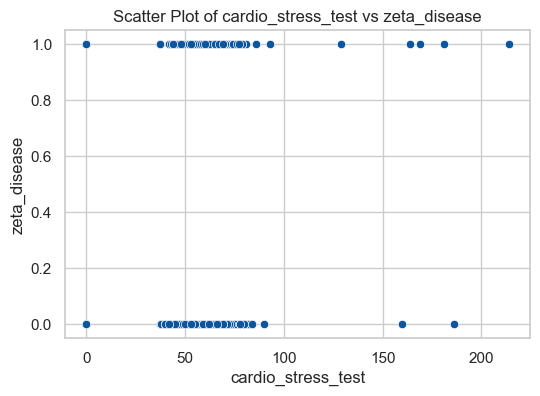

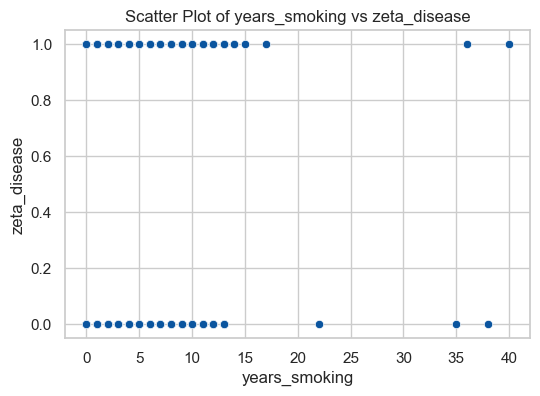

In [9]:
# Define the target column
target_column = 'zeta_disease'

# Iterate over each column in the DataFrame
for column in df1.columns:
    if column != target_column:
        plt.figure(figsize=(6, 4))
        sns.scatterplot(data=df1, x=column, y=target_column)
        plt.title(f'Scatter Plot of {column} vs {target_column}')
        plt.xlabel(column)
        plt.ylabel(target_column)
        plt.show()


### Isues with data
There appear to be some issues with the following variables: bmi, blood_pressure, insulin_test, cardio_stress_test
These all have values of 0 where there should be something higher. I will need to determine the best approach to address the wrong values. Should they be median, mean, dropped, imputed via some other process?

#### Age

In [10]:
#Look at blood_pressure values where they are 0 (meaning they didn't take one) and we end up with 28 values.
df1['age'].value_counts()

age
19     73
18     67
22     49
21     47
20     41
25     36
24     33
23     33
26     31
28     24
27     22
38     21
39     19
34     18
30     17
35     16
29     16
33     16
31     15
42     15
40     14
43     14
36     13
37     13
32     10
48      9
41      9
49      8
47      8
55      7
44      7
51      6
50      6
54      5
45      5
57      5
46      5
60      5
63      4
53      4
59      4
52      4
62      3
64      3
56      3
99      2
58      2
109     2
104     2
102     2
66      2
69      1
67      1
61      1
65      1
78      1
Name: count, dtype: int64

In [11]:
# Calculate statistics and calculate outliers 
subset_cst = df1[df1['age']>0]
mean = subset_cst['age'].mean()
std_dev = subset_cst['age'].std()

# Define thresholds based on z-score using 3 standard deviations from the mean
threshold = 3

# Identify outliers using z-score
outliers = subset_cst[(subset_cst['age'] - mean).abs() > threshold * std_dev]

print("mean:",mean)
print("std_dev:", std_dev)
print("Outliers identified using z-score:")
print(outliers['age'])

mean: 30.985
std_dev: 13.824024543099243
Outliers identified using z-score:
45     104
56     109
151     99
374    102
379    102
393     99
703    104
748     78
798    109
Name: age, dtype: int64


In [12]:
# Although I know it is possible, I am going to make the assumption that the ages greater than 102 are incorrect data.
# So I am going to drop rows where the value in 'age' is >= 102. This will drop out 4 rows of outliers
df1 = df1[(df1['blood_pressure'] < 102)]
df1

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
0,54,189,27.1,80,0,1.5038,0,10,0
1,23,150,38.5,68,71,0.3868,55,2,0
2,47,186,29.9,90,0,0.2728,0,7,0
3,18,150,30.8,70,1033,0.6598,56,0,0
4,24,160,32.4,74,125,0.7608,59,2,0
...,...,...,...,...,...,...,...,...,...
795,26,161,28.4,90,78,0.5578,42,3,0
796,37,165,33.7,60,0,0.3078,69,6,1
797,27,166,25.6,74,0,0.2638,0,5,0
798,109,139,28.1,66,94,0.2298,53,1,0


#### BMI

In [13]:
#Look at BMI values where they are less than 15 as that is "severe thinness" and we end up with 11 values. If we need to drop, 11 isn't too high of number to drop
df1[df1['bmi']< 15]

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
27,66,186,0.0,82,0,0.7028,0,5,0
146,18,152,0.0,75,0,0.6348,53,0,0
227,21,155,0.0,0,0,0.3678,0,7,0
354,23,164,0.0,0,0,0.2518,0,6,0
447,22,144,0.0,0,0,0.3188,0,0,0
467,27,165,0.0,0,0,0.3238,0,10,1
509,18,134,0.0,0,0,0.3668,0,2,0
522,51,175,0.0,96,0,0.2948,0,8,1
687,18,168,0.0,64,89,1.7938,53,0,0
711,19,130,0.0,0,0,0.2368,0,3,0


Since there are so few values of bmi = 0, I am going to drop them. It looks like these rows are missing a lot of the other columns that i will be evaluating, so this will also help the overall impact of 0 values. 

In [14]:
df1 = df1[df1['bmi'] != 0]

#### Blood Pressure

In [15]:
#Look at blood_pressure values where they are 0 (meaning they didn't take one) and we end up with 28 values.
df1['blood_pressure'].value_counts()

blood_pressure
70     61
74     52
72     49
78     45
68     44
76     43
64     43
80     42
60     39
62     39
66     32
82     29
0      28
88     25
84     24
90     23
86     22
58     21
52     13
50     13
56     12
54     11
92      8
65      7
75      7
85      6
94      6
44      4
48      4
100     3
96      3
98      3
46      2
55      2
30      2
61      1
40      1
95      1
38      1
24      1
Name: count, dtype: int64

In [16]:
# Calculate statistics and calculate outliers 
subset_cst = df1[df1['blood_pressure']>0]
mean = subset_cst['blood_pressure'].mean()
std_dev = subset_cst['blood_pressure'].std()

# Define thresholds based on z-score using 3 standard deviations from the mean
threshold = 3

# Identify outliers using z-score
outliers = subset_cst[(subset_cst['blood_pressure'] - mean).abs() > threshold * std_dev]

print("mean:",mean)
print("std_dev:", std_dev)
print("Outliers identified using z-score:")
print(outliers['blood_pressure'])

mean: 71.67204301075269
std_dev: 11.362139824544267
Outliers identified using z-score:
336    30
595    30
641    24
Name: blood_pressure, dtype: int64


In [17]:
# Drop rows where the value in 'blood_pressure' is >= 122 OR <= 30 as those seem to be data entry errors. This will drop out 9 rows of outliers and 28 rows of 0's
df1 = df1[((df1['blood_pressure'] < 122) | (df1['blood_pressure'] > 30)) & (df1['blood_pressure'] != 0)]

df1

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
0,54,189,27.1,80,0,1.5038,0,10,0
1,23,150,38.5,68,71,0.3868,55,2,0
2,47,186,29.9,90,0,0.2728,0,7,0
3,18,150,30.8,70,1033,0.6598,56,0,0
4,24,160,32.4,74,125,0.7608,59,2,0
...,...,...,...,...,...,...,...,...,...
795,26,161,28.4,90,78,0.5578,42,3,0
796,37,165,33.7,60,0,0.3078,69,6,1
797,27,166,25.6,74,0,0.2638,0,5,0
798,109,139,28.1,66,94,0.2298,53,1,0


#### Cardio stress test

In [18]:
#Look at cardio_stress_test values where they are 0 (meaning they didn't take one) and we end up with 218 values.
df1['cardio_stress_test'].value_counts()

cardio_stress_test
0      187
62      31
60      28
57      23
58      23
48      23
53      21
63      20
61      19
56      18
59      18
69      18
49      18
55      17
52      16
45      16
70      16
67      15
47      14
71      14
65      14
66      14
72      12
50      11
43      11
54      11
51      10
64       8
42       7
75       7
68       7
41       7
44       6
40       6
76       6
73       6
46       6
78       5
74       5
77       4
80       3
37       3
79       3
38       2
82       2
84       2
186      1
164      1
129      1
93       1
169      1
86       1
214      1
181      1
160      1
81       1
90       1
Name: count, dtype: int64

##### Look at cardio_stress_test Outliers
I'm going to temporarily drop the 0 values from the set to determine the outliers with only those values where the test was taken. 

From there I will remove the outliers and then calculate the averages for use in filling missing values. 

In [19]:
# Calculate statistics and calculate outliers 
subset_cst = df1[df1['cardio_stress_test']>0]
mean = subset_cst['cardio_stress_test'].mean()
std_dev = subset_cst['cardio_stress_test'].std()

# Define thresholds based on z-score
threshold = 3

# Identify outliers using z-score
outliers = subset_cst[(subset_cst['cardio_stress_test'] - mean).abs() > threshold * std_dev]

print(mean)
print(std_dev)
print("Outliers identified using z-score:")
print(outliers['cardio_stress_test'])

60.23518850987433
16.343006683453545
Outliers identified using z-score:
149    186
236    160
438    181
442    214
452    169
491    129
597    164
Name: cardio_stress_test, dtype: int64


In [20]:
# Drop rows where the value in 'cardio_stress_test' is greater than 129 as those seem to be data entry errors. This will drop out 7 rows
df1 = df1[df1['cardio_stress_test'] <= 129]

df1.head()

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease
0,54,189,27.1,80,0,1.5038,0,10,0
1,23,150,38.5,68,71,0.3868,55,2,0
2,47,186,29.9,90,0,0.2728,0,7,0
3,18,150,30.8,70,1033,0.6598,56,0,0
4,24,160,32.4,74,125,0.7608,59,2,0


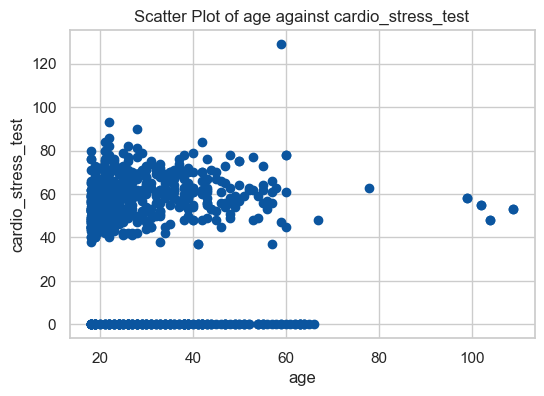

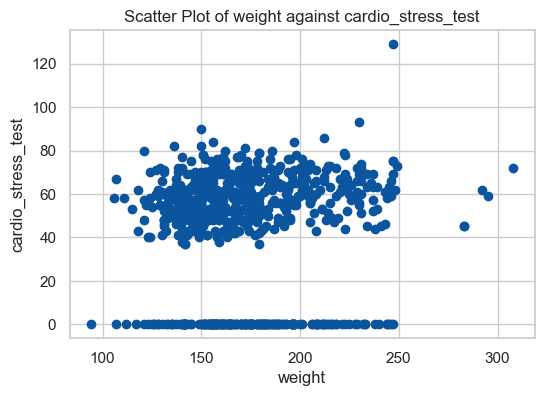

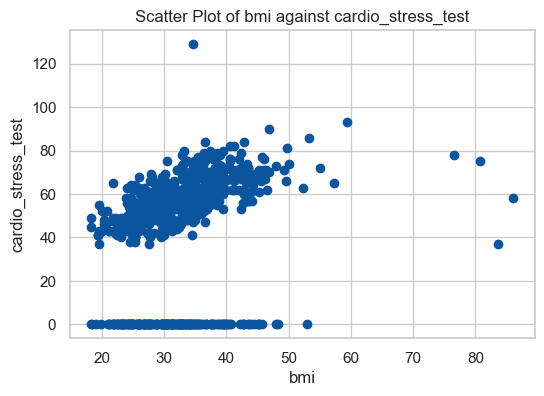

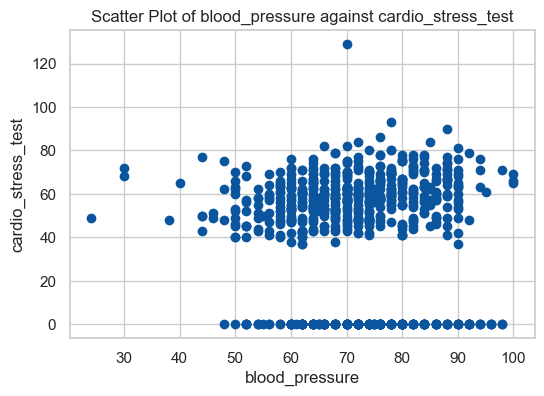

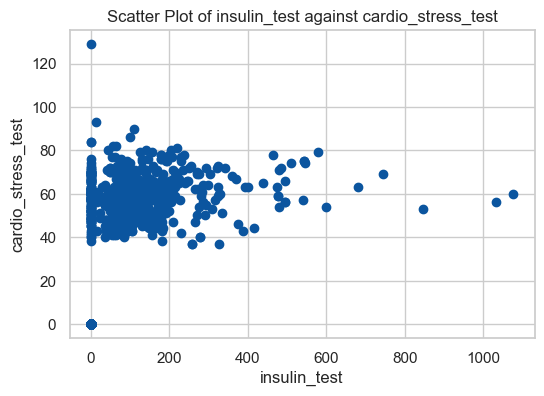

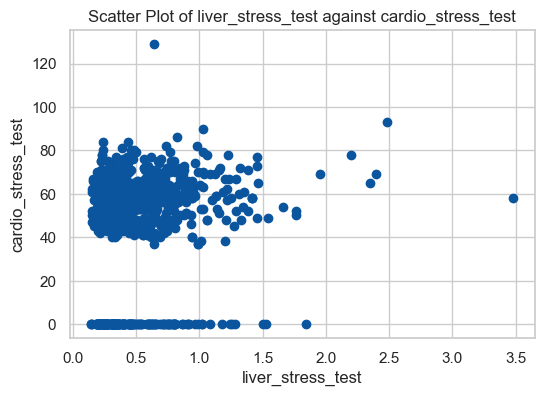

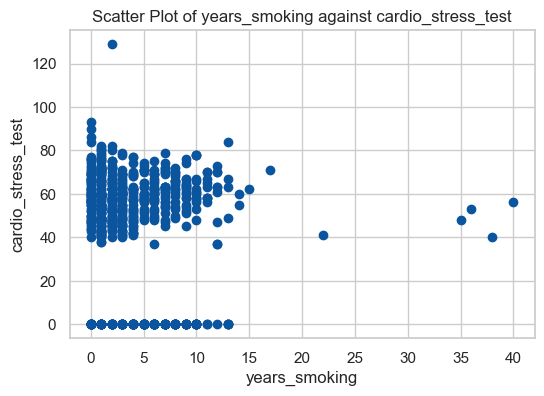

In [21]:
# Scatter plot of column1 against column2
cols = ['age','weight','bmi','blood_pressure','insulin_test','liver_stress_test','years_smoking']

for col in cols:
    plt.figure(figsize=(6, 4))
    plt.scatter(df1[col], df1['cardio_stress_test'])
    plt.xlabel(col)
    plt.ylabel('cardio_stress_test')
    plt.title(f'Scatter Plot of {col} against cardio_stress_test')
    plt.grid(True)
    plt.show()

##### Cardio Stress Test seems to have a linear relationship with BMI, so I will calculate the missing values of cardio_stress_test

In [22]:
# Split the DataFrame into two parts: one with missing values and one without
missing_values_df = df1[df1.cardio_stress_test == 0]
complete_values_df = df1[df1.cardio_stress_test != 0]

# Define features (X) and target variable (y) for the complete values
X_train = complete_values_df[['bmi']]
y_train = complete_values_df['cardio_stress_test']

# Fit the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Get the coefficients (slope and intercept)
slope = model.coef_[0]
intercept = model.intercept_

# Impute missing values using the regression line
missing_values_df['cardio_stress_test_imputed'] = slope * missing_values_df['bmi'] + intercept

# Combine the DataFrame with imputed values and the DataFrame with complete values
df_imputed = pd.concat([complete_values_df, missing_values_df], sort=False)

# print("Original DataFrame with missing values:")
# print(df1)
print("\nDataFrame with missing values imputed:")
df_imputed.head()


DataFrame with missing values imputed:


C:\Users\brent\AppData\Local\Temp\ipykernel_26944\3990125268.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing_values_df['cardio_stress_test_imputed'] = slope * missing_values_df['bmi'] + intercept


,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease,cardio_stress_test_imputed
1,23,150,38.5,68,71,0.3868,55,2,0,NaN
3,18,150,30.8,70,1033,0.6598,56,0,0,NaN
4,24,160,32.4,74,125,0.7608,59,2,0,NaN
6,20,154,27.8,64,116,0.5168,53,0,0,NaN
7,37,167,34.5,88,145,0.4658,54,1,1,NaN


#### Insulin test

In [23]:
#Look at insulin_test values where they are 0 and we end up with 360 values.
df_imputed['insulin_test'].value_counts()

insulin_test
0      324
94      11
105     11
120      9
180      8
      ... 
171      1
166      1
271      1
41       1
108      1
Name: count, Length: 187, dtype: int64

In [24]:
# Count the occurrences of 0 in the specific column
zero_count = (df_imputed['insulin_test'] == 0).sum()

# Calculate the percentage
total_rows = df_imputed.shape[0]
percent_zero = (zero_count / total_rows) * 100

In [25]:
print(f"Percentage of 0 values in the insulin_test: {percent_zero:.2f}%")

Percentage of 0 values in the insulin_test: 43.90%


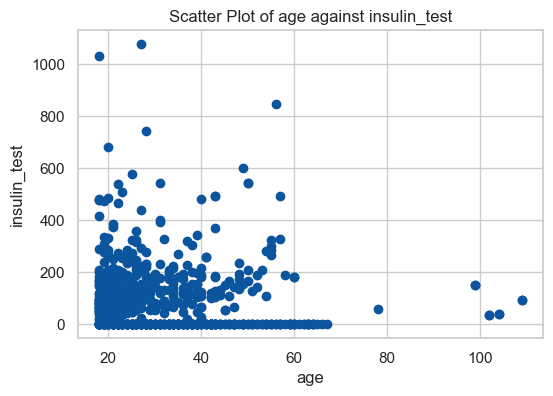

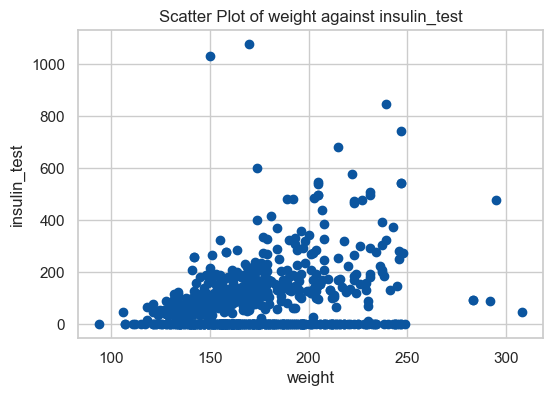

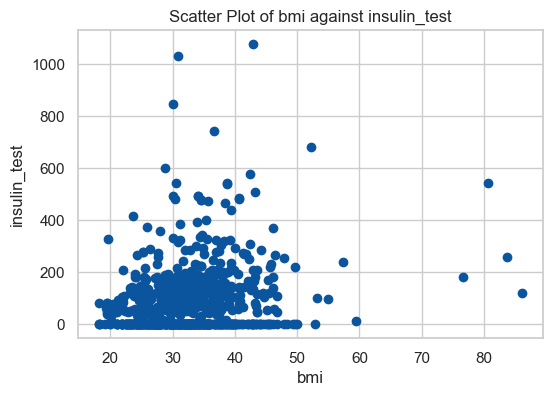

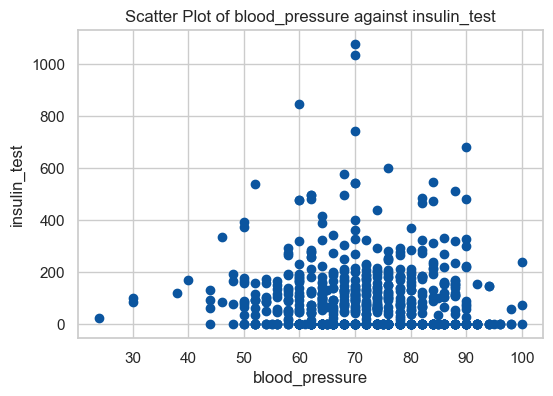

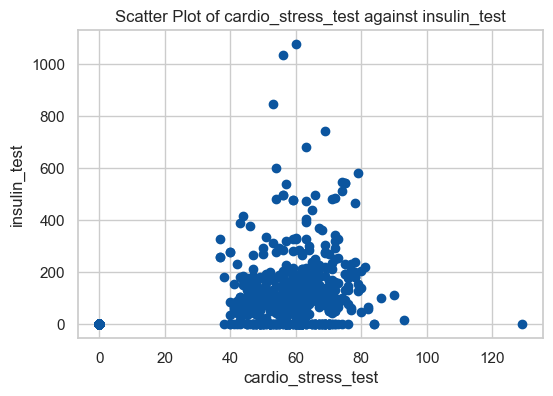

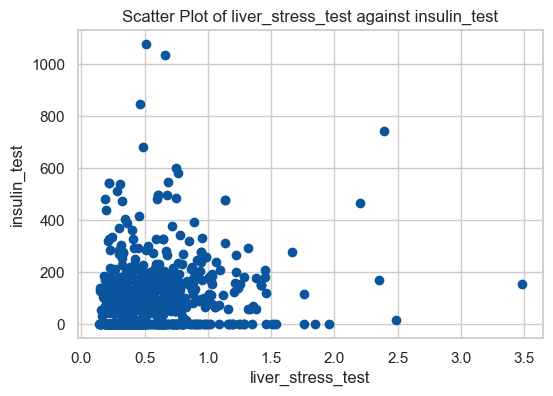

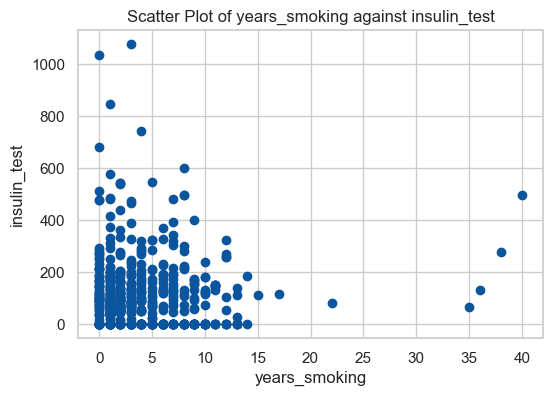

In [26]:
# Scatter plot of column1 against column2
cols = ['age','weight','bmi','blood_pressure','cardio_stress_test','liver_stress_test','years_smoking']

for col in cols:
    plt.figure(figsize=(6, 4))
    plt.scatter(df_imputed[col], df_imputed['insulin_test'])
    plt.xlabel(col)
    plt.ylabel('insulin_test')
    plt.title(f'Scatter Plot of {col} against insulin_test')
    plt.grid(True)
    plt.show()

##### Look at insulin_test Outliers
I'm going to temporarily drop the 0 values from the set to determine the outliers with only those values where the test was taken. 

From there I will remove the outliers and then impute the 0 values using linear regression with weight. 

In [27]:
# Calculate statistics and calculate outliers 
subset_cst = df_imputed[df_imputed['insulin_test']>0]
mean = subset_cst['insulin_test'].mean()
std_dev = subset_cst['insulin_test'].std()

# Define thresholds based on z-score
threshold = 3

# Identify outliers using z-score
outliers = subset_cst[(subset_cst['insulin_test'] - mean).abs() > threshold * std_dev]

print(mean)
print(std_dev)
print("Outliers identified using z-score:")
print(outliers['insulin_test'])

160.4927536231884
135.74776743588743
Outliers identified using z-score:
3      1033
310     744
338     680
465     600
643    1077
743     579
792     846
Name: insulin_test, dtype: int64


In [28]:
# Drop rows where the value in 'insulin_test' is greater than 579 as those seem to be data entry errors. This will drop out 7 rows
df_imputed = df_imputed[df_imputed['insulin_test'] < 579]

df_imputed.head()

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease,cardio_stress_test_imputed
1,23,150,38.5,68,71,0.3868,55,2,0,NaN
4,24,160,32.4,74,125,0.7608,59,2,0,NaN
6,20,154,27.8,64,116,0.5168,53,0,0,NaN
7,37,167,34.5,88,145,0.4658,54,1,1,NaN
8,21,162,34.8,80,132,0.2798,75,1,0,NaN


In [29]:
# Split the DataFrame into two parts: one with missing values and one without
missing_values_df = df_imputed[df_imputed.insulin_test == 0]
complete_values_df = df_imputed[df_imputed.insulin_test != 0]

# Define features (X) and target variable (y) for the complete values
X_train = complete_values_df[['weight']]
y_train = complete_values_df['insulin_test']

# Fit the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Get the coefficients (slope and intercept)
slope = model.coef_[0]
intercept = model.intercept_

# Impute missing values using the regression line
#missing_values_df['insulin_test_imputed'] = slope * missing_values_df['weight'] + intercept
missing_values_df.loc[:, 'insulin_test_imputed'] = slope * missing_values_df['weight'] + intercept

# Combine the DataFrame with imputed values and the DataFrame with complete values
df_imputed2 = pd.concat([complete_values_df, missing_values_df], sort=False)

# print("Original DataFrame with missing values:")
# print(df1)
print("\nDataFrame with missing values imputed:")
df_imputed2.head()


DataFrame with missing values imputed:


C:\Users\brent\AppData\Local\Temp\ipykernel_26944\193083520.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing_values_df.loc[:, 'insulin_test_imputed'] = slope * missing_values_df['weight'] + intercept


,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease,cardio_stress_test_imputed,insulin_test_imputed
1,23,150,38.5,68,71,0.3868,55,2,0,NaN,NaN
4,24,160,32.4,74,125,0.7608,59,2,0,NaN,NaN
6,20,154,27.8,64,116,0.5168,53,0,0,NaN,NaN
7,37,167,34.5,88,145,0.4658,54,1,1,NaN,NaN
8,21,162,34.8,80,132,0.2798,75,1,0,NaN,NaN


## Set groups for ages to see if that is useful

## Check for Duplicates

In [30]:
duplicates = df_imputed2.duplicated()
df_imputed2[duplicates]

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,years_smoking,zeta_disease,cardio_stress_test_imputed,insulin_test_imputed
379,102,129,25.4,80,37,0.6458,55,1,0,NaN,NaN
393,99,205,33.3,76,150,1.4158,58,11,1,NaN,NaN
703,104,131,26.6,72,40,0.3458,48,1,0,NaN,NaN
761,18,283,24.6,52,94,0.6998,45,2,0,NaN,NaN
798,109,139,28.1,66,94,0.2298,53,1,0,NaN,NaN


In [31]:
# Drop duplicate rows
df_cleaned = df_imputed2.drop_duplicates()
print("\nDataFrame after dropping duplicates:\n", df_cleaned)


DataFrame after dropping duplicates:
      age  weight   bmi  blood_pressure  insulin_test  liver_stress_test  \
1     23     150  38.5              68            71             0.3868   
4     24     160  32.4              74           125             0.7608   
6     20     154  27.8              64           116             0.5168   
7     37     167  34.5              88           145             0.4658   
8     21     162  34.8              80           132             0.2798   
..   ...     ...   ...             ...           ...                ...   
773   32     173  32.0              62             0             0.2888   
779   26     160  31.9              66             0             0.5338   
784   29     206  48.3              75             0             0.3008   
797   27     166  25.6              74             0             0.2638   
799   26     196  29.7              56             0             0.6268   

     cardio_stress_test  years_smoking  zeta_disease  \
1   

In [32]:
# Replace NaN values in 'column_with_nan' with values from 'replacement_column'
df_cleaned.loc[df_cleaned['cardio_stress_test_imputed'].isnull(),
    'cardio_stress_test_imputed'] = df_cleaned.loc[df_cleaned[
    'cardio_stress_test_imputed'].isnull(), 'cardio_stress_test']

df_cleaned.loc[df_cleaned['insulin_test_imputed'].isnull(),
    'insulin_test_imputed'] = df_cleaned.loc[df_cleaned[
    'insulin_test_imputed'].isnull(), 'insulin_test']

# Drop 'replacement_column' if no longer needed
df_cleaned.drop(columns=['cardio_stress_test','insulin_test'], inplace=True)

df_cleaned.sample(10)

C:\Users\brent\AppData\Local\Temp\ipykernel_26944\472974139.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.drop(columns=['cardio_stress_test','insulin_test'], inplace=True)


,age,weight,bmi,blood_pressure,liver_stress_test,years_smoking,zeta_disease,cardio_stress_test_imputed,insulin_test_imputed
292,41,142,83.7,62,0.9888,12,1,37.000000,258.000000
384,22,134,31.9,68,0.6538,3,0,60.000000,106.000000
611,52,187,24.2,61,0.2138,6,0,52.280502,172.878284
713,47,188,36.1,74,0.6198,11,1,56.000000,144.000000
563,21,145,37.4,85,0.3098,0,1,55.000000,36.000000
756,40,186,37.1,70,0.2158,15,1,62.000000,110.000000
40,22,137,32.7,58,0.2288,2,0,46.000000,52.000000
578,25,150,19.5,74,0.2118,1,0,42.000000,46.000000
487,53,161,37.1,72,1.4528,4,1,77.000000,207.000000
779,26,160,31.9,66,0.5338,4,0,58.077682,127.423592


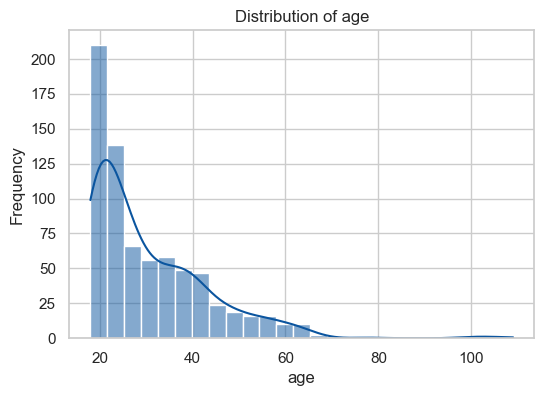

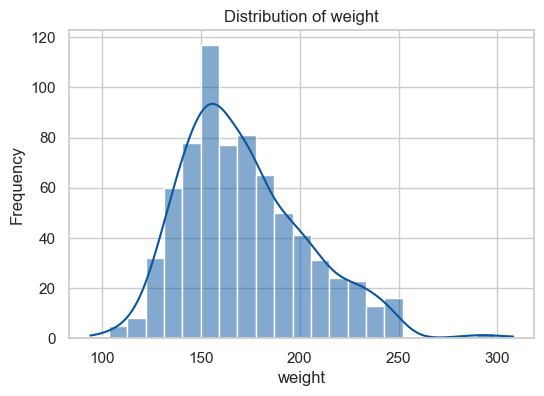

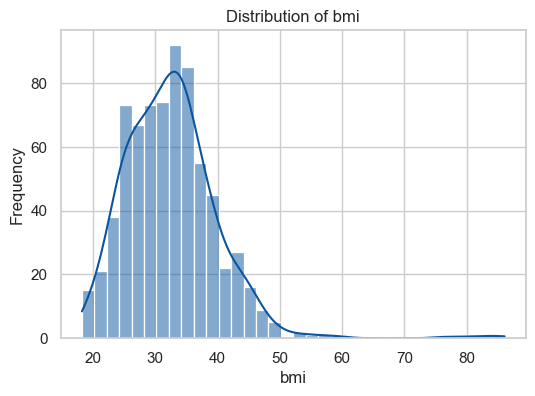

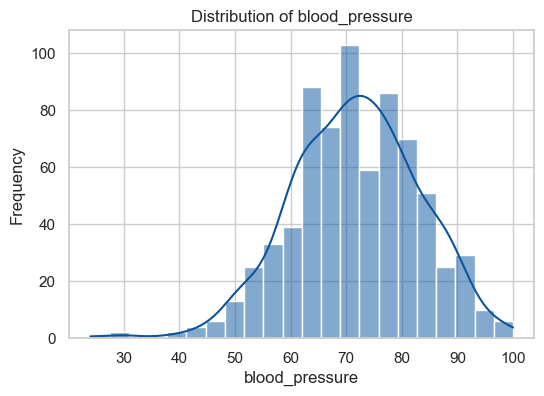

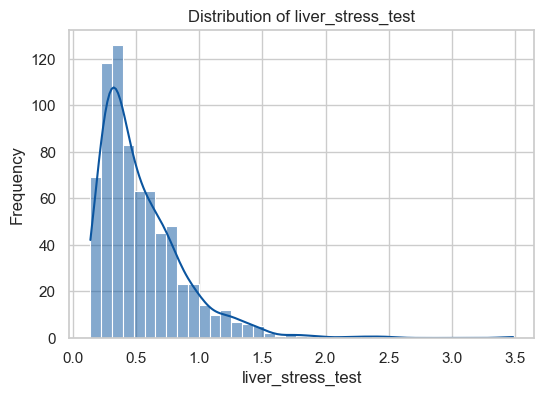

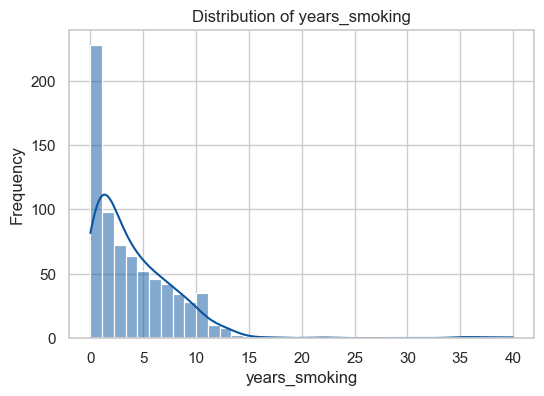

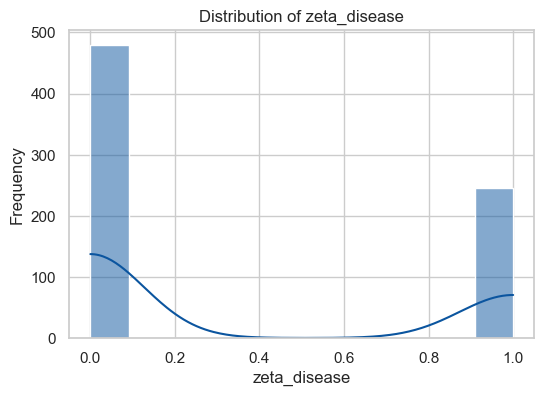

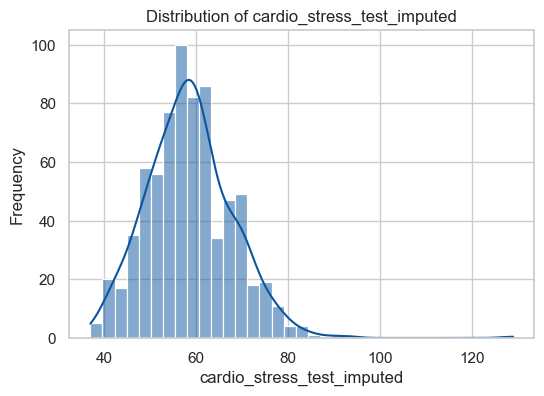

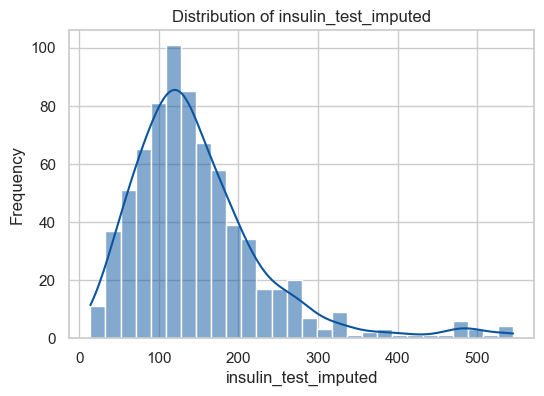

In [33]:
for column in df_cleaned.columns:
    plt.figure(figsize=(6, 4))
    if pd.api.types.is_numeric_dtype(df_cleaned[column]):
        sns.histplot(df_cleaned[column], kde=True)
        plt.title(f'Distribution of {column}')
    else:
        sns.countplot(x=df_cleaned[column])
        plt.title(f'Count plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

### We have a couple left skewed data distributions for variables. I am going to apply log transformation to attemp to get them to normal distributions.

In [34]:
# Apply log transformation
df_cleaned['log_age'] = np.log(df_cleaned['age'])
df_cleaned['log_liver_stress_test'] = np.log(df_cleaned['liver_stress_test'])
df_cleaned['log_bmi'] = np.log(df_cleaned['bmi'])
df_cleaned['log_insulin_test_imputed'] = np.log(df_cleaned['insulin_test_imputed'])

#since years_smoking includes 0, it needs to be shifted
shifted_data = df_cleaned['years_smoking'] - df_cleaned['years_smoking'].min() + 1
df_cleaned['log_years_smoking'] = np.log(shifted_data)

C:\Users\brent\AppData\Local\Temp\ipykernel_26944\2145393745.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['log_age'] = np.log(df_cleaned['age'])
C:\Users\brent\AppData\Local\Temp\ipykernel_26944\2145393745.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['log_liver_stress_test'] = np.log(df_cleaned['liver_stress_test'])
C:\Users\brent\AppData\Local\Temp\ipykernel_26944\2145393745.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

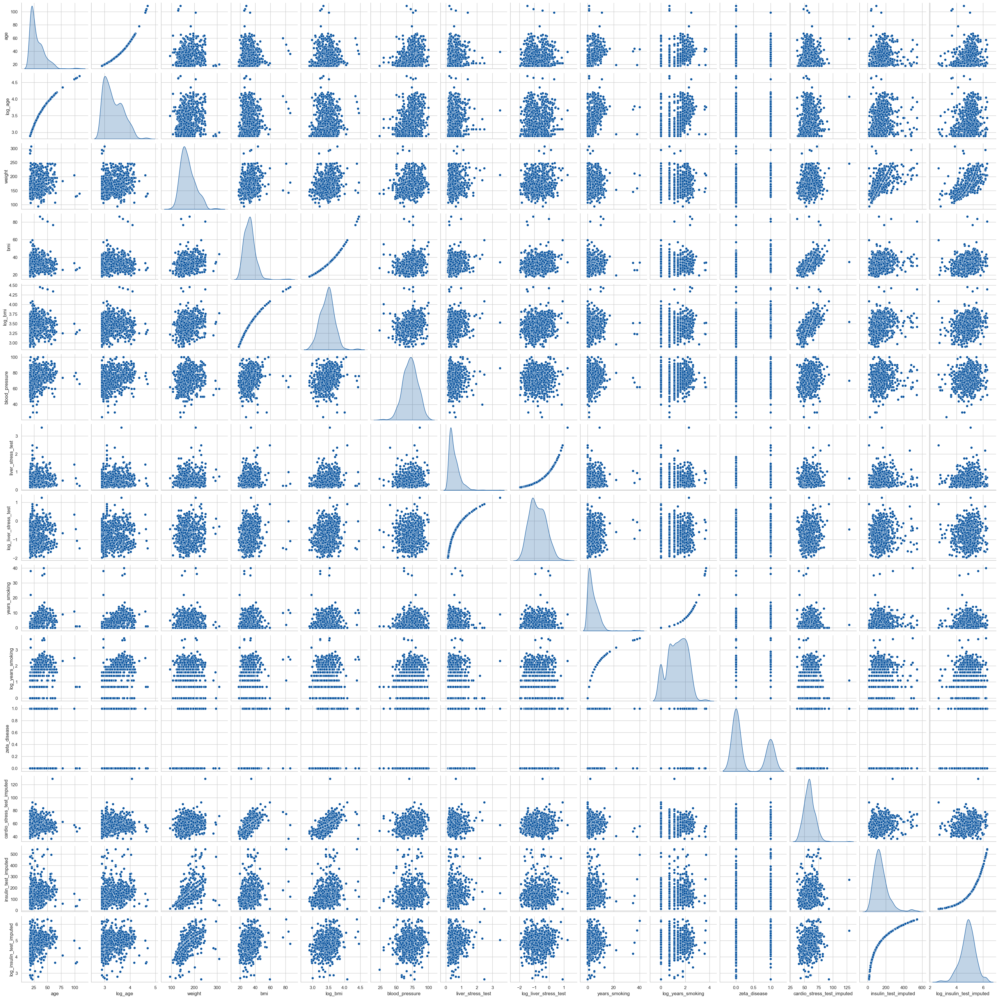

In [35]:
# Step 3: Relationships and Visualization
# Pairplot for numeric columns
sns.pairplot(df_cleaned,
             x_vars=['age','log_age','weight','bmi','log_bmi','blood_pressure','liver_stress_test','log_liver_stress_test',
                     'years_smoking','log_years_smoking','zeta_disease','cardio_stress_test_imputed','insulin_test_imputed',
                     'log_insulin_test_imputed'],
             y_vars=['age','log_age','weight','bmi','log_bmi','blood_pressure','liver_stress_test','log_liver_stress_test',
                     'years_smoking','log_years_smoking','zeta_disease','cardio_stress_test_imputed','insulin_test_imputed',
                     'log_insulin_test_imputed'],
             diag_kind='kde')
plt.show()

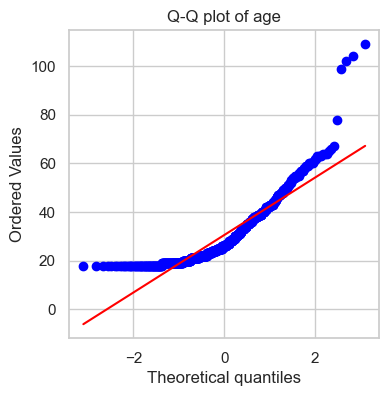

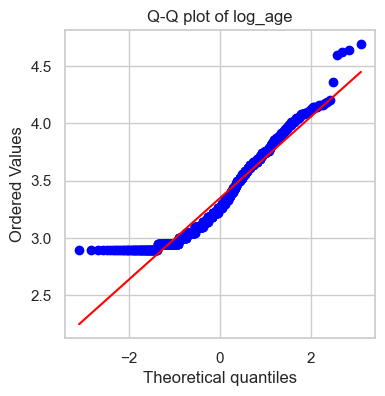

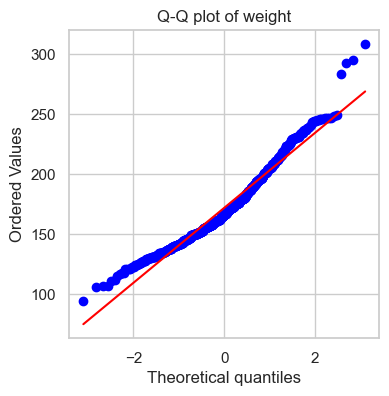

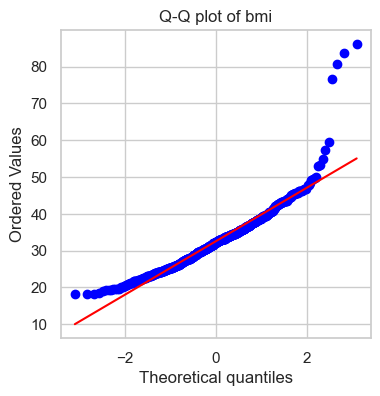

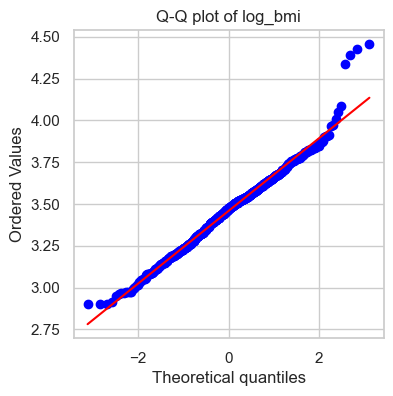

...

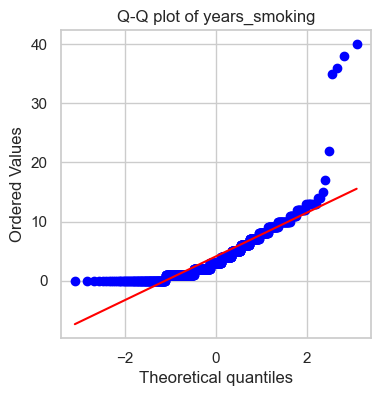

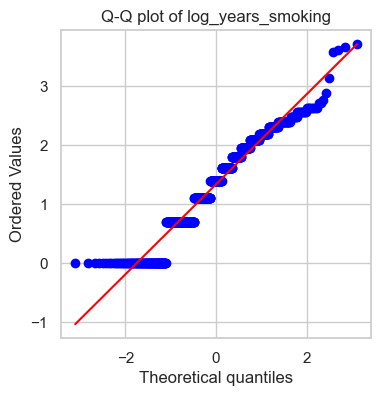

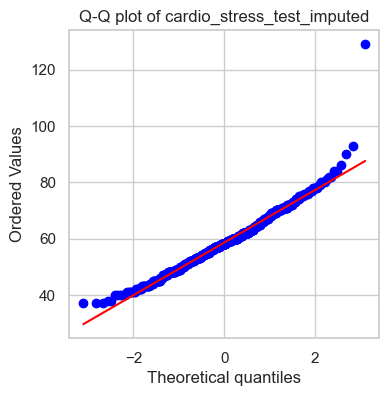

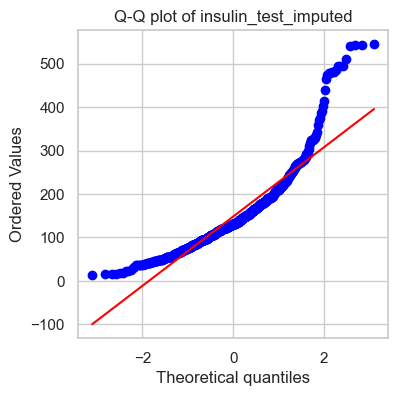

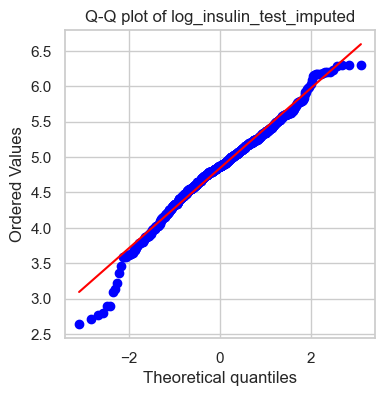

In [36]:
from scipy.stats import probplot
cols = ['age','log_age','weight','bmi','log_bmi','blood_pressure','liver_stress_test','log_liver_stress_test',
        'years_smoking','log_years_smoking','cardio_stress_test_imputed','insulin_test_imputed',
        'log_insulin_test_imputed']

# Create Q-Q plots for each column
def qq_plot(data, col_name):
    plt.figure(figsize=(4, 4))
    probplot(data, dist="norm", plot=plt)
    plt.title(f'Q-Q plot of {col_name}')
    plt.show()

for col in cols:
    qq_plot(df_cleaned[col], col)

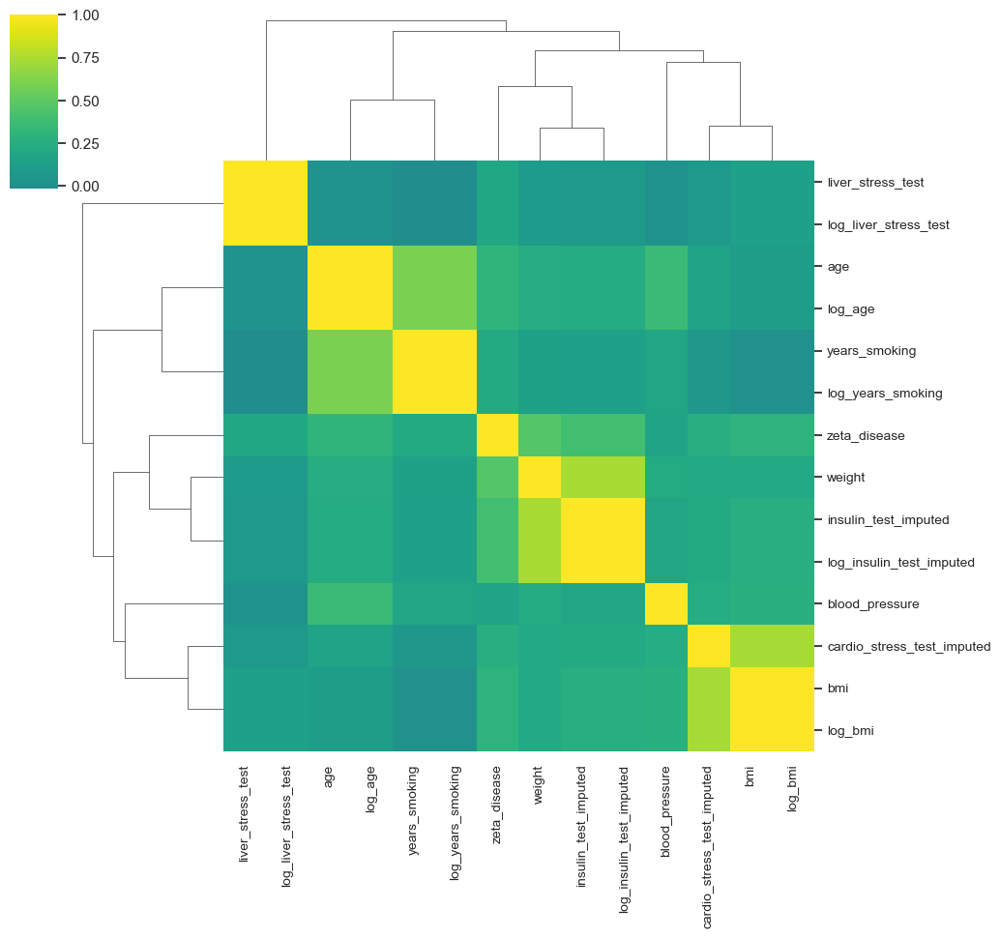

In [37]:
# calculate correlation matrix
## using non-parametric test of correlation (kendall), since some features are binary
corrs = df_cleaned.select_dtypes(include=np.number).corr(method = 'spearman')

# plot clustered heatmap of correlations
cluster = sns.clustermap(corrs, cbar_pos=(-0.05, 0.8, 0.05, 0.18), cmap='viridis', center=0);

# Adjust the text size and rotation of row labels
row_labels = cluster.ax_heatmap.get_yticklabels()
for label in row_labels:
    label.set_size(10)  # Set the text size
    label.set_rotation(0)  # Set the rotation angle (0 degrees)

# Adjust the text size of column labels
cluster.ax_heatmap.set_xticklabels(cluster.ax_heatmap.get_xticklabels(), size=10)

plt.show()

#### Drop the following columns as the log version is more suitable

['age','bmi','liver_stress_test','years_smoking','cardio_stress_test_imputed','age_groups_int']

In [38]:
df_final = df_cleaned.drop(columns = ['age','bmi','liver_stress_test','years_smoking',
                                      'insulin_test_imputed'])

# Use this data to do training and testing splits and find the best model
#### Note on the scoring metric (recall)
I am going to choose recall as my metric. The reason is that I want to make sure to catch all of the potential cases of the disease. By choosing recall I will minimize the false negatives and therefore will minimize the risk of saying that someone does not have the disease, when they acutually have the disease. This does come with a risk as it will potentially identify some individuals as positive when they actually are not. 

In [39]:
df_final.head()

,weight,blood_pressure,zeta_disease,cardio_stress_test_imputed,log_age,log_liver_stress_test,log_bmi,log_insulin_test_imputed,log_years_smoking
1,150,68,0,55.0,3.135494,-0.949848,3.650658,4.262680,1.098612
4,160,74,0,59.0,3.178054,-0.273385,3.478158,4.828314,1.098612
6,154,64,0,53.0,2.995732,-0.660099,3.325036,4.753590,0.000000
7,167,88,1,54.0,3.610918,-0.763999,3.540959,4.976734,0.693147
8,162,80,0,75.0,3.044522,-1.273680,3.549617,4.882802,0.693147


In [40]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 726 entries, 1 to 799
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   weight                      726 non-null    int64  
 1   blood_pressure              726 non-null    int64  
 2   zeta_disease                726 non-null    int64  
 3   cardio_stress_test_imputed  726 non-null    float64
 4   log_age                     726 non-null    float64
 5   log_liver_stress_test       726 non-null    float64
 6   log_bmi                     726 non-null    float64
 7   log_insulin_test_imputed    726 non-null    float64
 8   log_years_smoking           726 non-null    float64
dtypes: float64(6), int64(3)
memory usage: 56.7 KB


In [41]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.utils.class_weight import compute_class_weight
from xgboost import XGBClassifier

# Split data into features and target variable
X = df_final.drop(columns=['zeta_disease']) 
y = df_final['zeta_disease']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Compute class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Create preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[('scaler', StandardScaler(), X.columns)
                 ])

# Create pipeline with hyperparameter search
pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())  # Default classifier, to be replaced by GridSearchCV
])

# Define hyperparameter grid for each classifier
param_grid = [
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__p': [1,2]
    },
    {
        'classifier': [GaussianNB()]
    },
    {
        'classifier': [SVC()],
        'classifier__C': [0.001, 0.01, 0.1, 1, 10],
        'classifier__kernel': ['linear','rbf']
    },
    {
        'classifier': [LogisticRegression(class_weight=class_weight_dict)],
        'classifier__penalty': ['l1','l2'],
        'classifier__C': [0.001, 0.005, 0.01, 0.1, 1],
        'classifier__solver': ['liblinear']
    },
    {
        'classifier': [RandomForestClassifier(class_weight=class_weight_dict)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 10, 20],
        'classifier__bootstrap': [True, False]
    },
    {
        'classifier': [DecisionTreeClassifier(class_weight=class_weight_dict)],
        'classifier__max_depth': [None, 10, 20],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 2, 4]
    },
    {
        'classifier': [XGBClassifier(scale_pos_weight=1.95)],
        'classifier__max_depth': [3, 4, 5],
        'classifier__learning_rate': [0.01, 0.1, 0.3],
        'classifier__n_estimators': [50, 100, 200],
    }
]

# Grid search
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='recall')

# Fit grid search
grid.fit(X_train, y_train)

# Best model and score
best_model = grid.best_estimator_
best_score = grid.best_score_

# Evaluate the best model
recall = best_model.score(X_test, y_test)
print("Best Model:", best_model)
print("Best Score (CV recall):", best_score)
print("Test recall:", recall)

Best Model: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  Index(['weight', 'blood_pressure', 'cardio_stress_test_imputed', 'log_age',
       'log_liver_stress_test', 'log_bmi', 'log_insulin_test_imputed',
       'log_years_smoking'],
      dtype='object'))])),
                ('classifier',
                 LogisticRegression(C=0.001,
                                    class_weight={0: 0.7559523809523809,
                                                  1: 1.4767441860465116},
                                    solver='liblinear'))])
Best Score (CV recall): 0.8030252100840336
Test recall: 0.6834862385321101


Coefficients of the best Logistic Regression model:
     weight  log_insulin_test_imputed   log_bmi  log_liver_stress_test  \
0  0.100724                  0.080421  0.068528               0.055331   

   cardio_stress_test_imputed   log_age  log_years_smoking  blood_pressure  
0                    0.051535  0.041493           0.038816        0.030258  


C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site

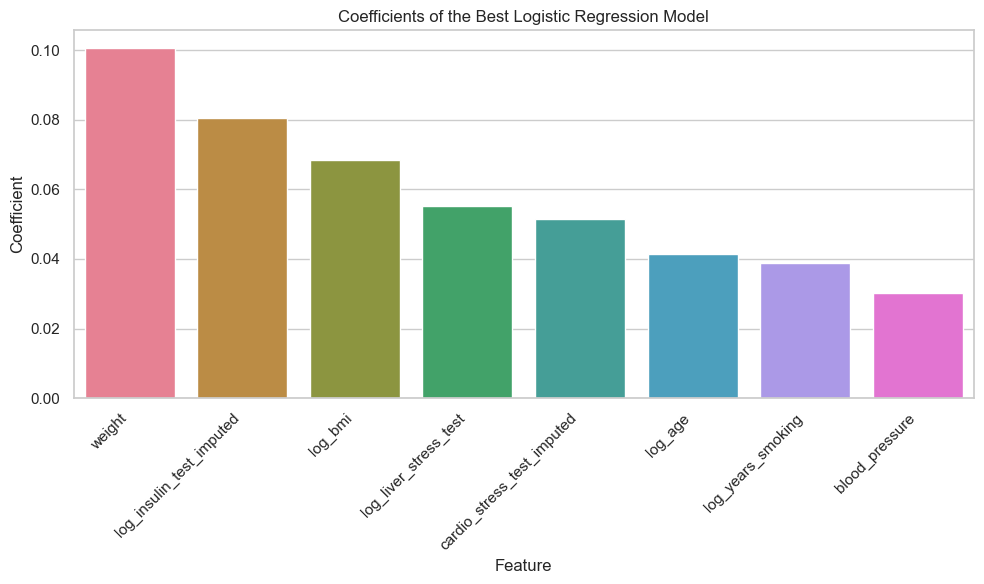

In [42]:
if isinstance(best_model.named_steps['classifier'], LogisticRegression):
    # Get the feature names after preprocessing
    feature_names = X.columns
    coefficients = best_model.named_steps['classifier'].coef_
    coef_df = pd.DataFrame(coefficients, columns=feature_names)
    # Extract the first row and sort it by values
    sorted_columns = coef_df.iloc[0].sort_values(ascending=False).index
    
    # Reorder the DataFrame columns
    df_reordered = coef_df[sorted_columns]

    print("Coefficients of the best Logistic Regression model:")
    print(df_reordered)

    # Plotting the coefficients
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df_reordered)

    # Adding titles and labels
    plt.title('Coefficients of the Best Logistic Regression Model')
    plt.xlabel('Feature')
    plt.ylabel('Coefficient')

    # Rotating x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Display the plot
    plt.tight_layout()
    plt.show()

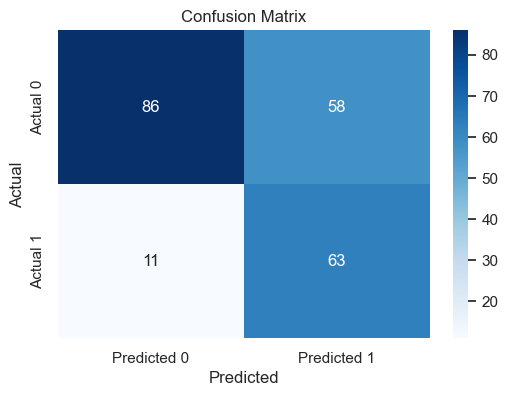

In [43]:
from sklearn.metrics import confusion_matrix, classification_report
y_pred = best_model.predict(X_test)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Predicted 0', 'Predicted 1'], 
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [44]:
# Optional: Print classification report for more detailed evaluation
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.60      0.71       144
           1       0.52      0.85      0.65        74

    accuracy                           0.68       218
   macro avg       0.70      0.72      0.68       218
weighted avg       0.76      0.68      0.69       218



## No drop the lowest 2 value variables and start again with the process. 

In [45]:
df_final_reduced = df_final.drop(columns = ['log_years_smoking','blood_pressure'])

In [46]:
df_final_reduced.head()

,weight,zeta_disease,cardio_stress_test_imputed,log_age,log_liver_stress_test,log_bmi,log_insulin_test_imputed
1,150,0,55.0,3.135494,-0.949848,3.650658,4.262680
4,160,0,59.0,3.178054,-0.273385,3.478158,4.828314
6,154,0,53.0,2.995732,-0.660099,3.325036,4.753590
7,167,1,54.0,3.610918,-0.763999,3.540959,4.976734
8,162,0,75.0,3.044522,-1.273680,3.549617,4.882802


In [47]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier

# Split data into features and target variable
X = df_final_reduced.drop(columns=['zeta_disease']) 
y = df_final_reduced['zeta_disease']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Compute class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Create preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[('scaler', StandardScaler(), X.columns)
                 ])

# Create pipeline with hyperparameter search
pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())  # Default classifier, to be replaced by GridSearchCV
])

# Define hyperparameter grid for each classifier
param_grid = [
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__p': [1,2]
    },
    {
        'classifier': [GaussianNB()]
    },
    {
        'classifier': [SVC()],
        'classifier__C': [0.001, 0.01, 0.1, 1, 10],
        'classifier__kernel': ['linear','rbf']
    },
    {
        'classifier': [LogisticRegression(class_weight=class_weight_dict)],
        'classifier__penalty': ['l1','l2'],
        'classifier__C': [0.001, 0.005, 0.01, 0.1, 1],
        'classifier__solver': ['liblinear']
    },
    {
        'classifier': [RandomForestClassifier(class_weight=class_weight_dict)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 10, 20],
        'classifier__bootstrap': [True, False]
    },
    {
        'classifier': [DecisionTreeClassifier(class_weight=class_weight_dict)],
        'classifier__max_depth': [None, 10, 20],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 2, 4]
    },
    {
        'classifier': [XGBClassifier(scale_pos_weight=1.95)],
        'classifier__max_depth': [3, 4, 5],
        'classifier__learning_rate': [0.01, 0.1, 0.3],
        'classifier__n_estimators': [50, 100, 200],
    }
]

# Grid search
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='recall') #roc_auc

# Fit grid search
grid.fit(X_train, y_train)

# Best model and score
best_model = grid.best_estimator_
best_score = grid.best_score_

# Evaluate the best model
recall = best_model.score(X_test, y_test)
print("Best Model:", best_model)
print("Best Score (CV recall):", best_score)
print("Test recall:", recall)

Best Model: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  Index(['weight', 'cardio_stress_test_imputed', 'log_age',
       'log_liver_stress_test', 'log_bmi', 'log_insulin_test_imputed'],
      dtype='object'))])),
                ('classifier',
                 LogisticRegression(C=0.001,
                                    class_weight={0: 0.7559523809523809,
                                                  1: 1.4767441860465116},
                                    solver='liblinear'))])
Best Score (CV recall): 0.8084033613445378
Test recall: 0.6743119266055045


Coefficients of the best Logistic Regression model:
    weight  log_insulin_test_imputed  log_bmi  log_liver_stress_test  \
0  0.10177                  0.081296  0.06894               0.055266   

   cardio_stress_test_imputed   log_age  
0                    0.051979  0.044883  


C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\brent\anaconda3\envs\dell\lib\site

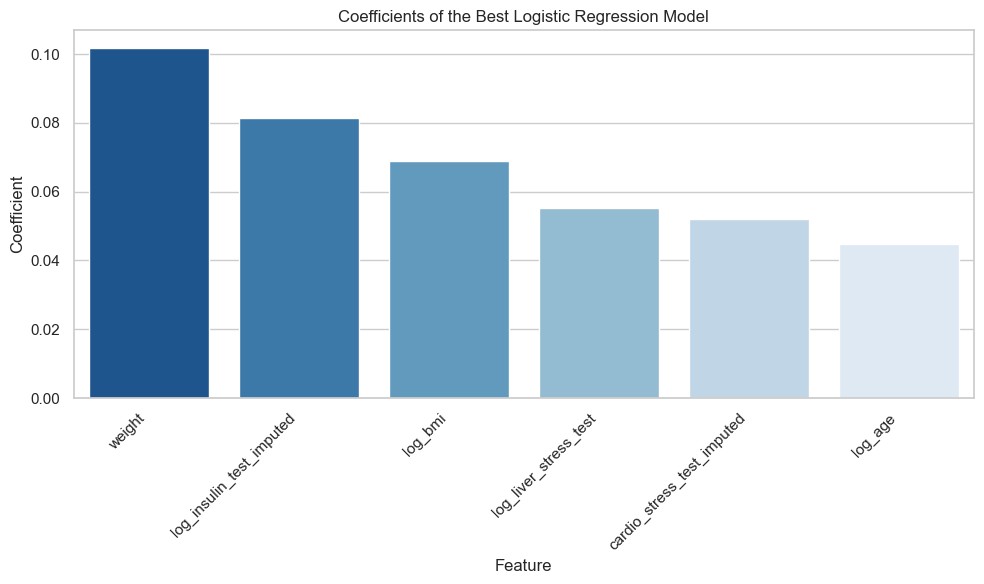

In [48]:
if isinstance(best_model.named_steps['classifier'], LogisticRegression):
    # Get the feature names after preprocessing
    feature_names = X.columns
    coefficients = best_model.named_steps['classifier'].coef_
    coef_df = pd.DataFrame(coefficients, columns=feature_names)
    # Extract the first row and sort it by values
    sorted_columns = coef_df.iloc[0].sort_values(ascending=False).index
    
    # Reorder the DataFrame columns
    df_reordered = coef_df[sorted_columns]

    print("Coefficients of the best Logistic Regression model:")
    print(df_reordered)

    # Plotting the coefficients
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df_reordered)

    # Adding titles and labels
    plt.title('Coefficients of the Best Logistic Regression Model')
    plt.xlabel('Feature')
    plt.ylabel('Coefficient')

    # Rotating x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Display the plot
    plt.tight_layout()
    plt.show()

else:
    feature_names = X.columns
    importances = best_model.named_steps['classifier'].feature_importances_
    indices = np.argsort(importances)

    plt.title('Feature Importances')
    plt.barh(range(len(indices)), importances[indices], color='b', align='center')
    plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()

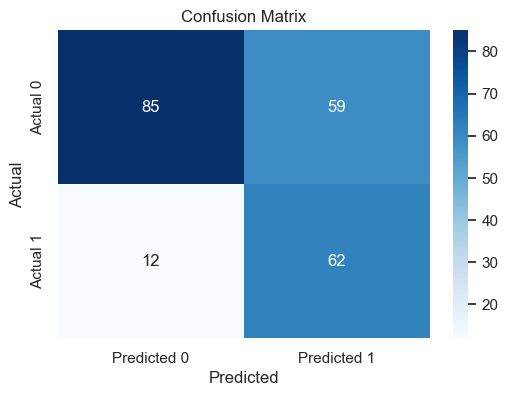

In [49]:
from sklearn.metrics import confusion_matrix, classification_report
y_pred = best_model.predict(X_test)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Predicted 0', 'Predicted 1'], 
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [50]:
# Optional: Print classification report for more detailed evaluation
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.59      0.71       144
           1       0.51      0.84      0.64        74

    accuracy                           0.67       218
   macro avg       0.69      0.71      0.67       218
weighted avg       0.75      0.67      0.68       218



C:\Users\brent\AppData\Local\Temp\ipykernel_26944\1330319052.py:7: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


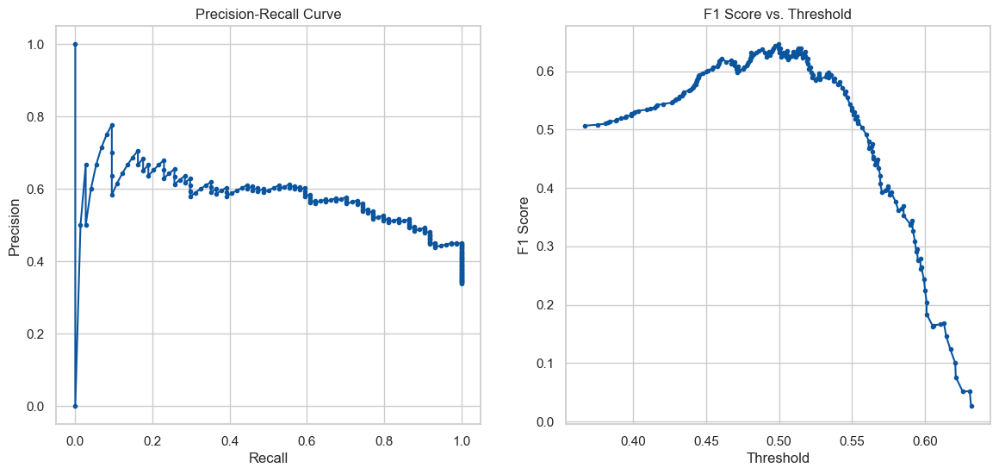

Optimal Threshold for F1 Score: 0.50
F1 Score at Optimal Threshold: 0.6464646464646465


In [70]:
from sklearn.metrics import precision_recall_curve, roc_curve, f1_score

y_probs = best_model.predict_proba(X_test)[:, 1]

# Calculate precision, recall, and thresholds
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_probs)
f1_scores = 2 * (precision * recall) / (precision + recall)

# Calculate ROC curve
fpr, tpr, thresholds_roc = roc_curve(y_test, y_probs)

# Plot Precision-Recall curve
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

# Plot F1 scores
plt.subplot(1, 2, 2)
plt.plot(thresholds_pr, f1_scores[:-1], marker='.')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score vs. Threshold')
plt.show()

# Find the threshold that maximizes the F1 score
f1_scores = [f1_score(y_test, y_probs >= threshold) for threshold in thresholds_roc]
optimal_threshold = thresholds_roc[np.argmax(f1_scores)]
print(f'Optimal Threshold for F1 Score: {optimal_threshold:.2f}')

# Evaluate metrics at the optimal threshold
y_pred_optimal = (y_probs >= optimal_threshold).astype(int)
f1 = f1_score(y_test, y_pred_optimal)
print(f"F1 Score at Optimal Threshold: {f1}")

# # Example of changing the decision threshold to 0.4x
# threshold = 0.5
# y_pred_custom = (y_probs >= threshold).astype(int)
# custom_f1 = f1_score(y_test, y_pred_custom)
# print(f"F1 Score at Threshold 0.5: {custom_f1}")

### Consideration: Optimal threshold happens to be at 0.5 for F1 score. If it were something more or less, we could change the decision point for the 0/1 decision. In this case, I will not change it. 

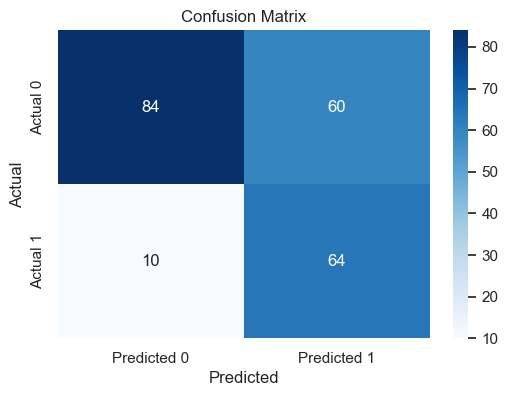

In [52]:
# Create confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_optimal)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Predicted 0', 'Predicted 1'], 
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

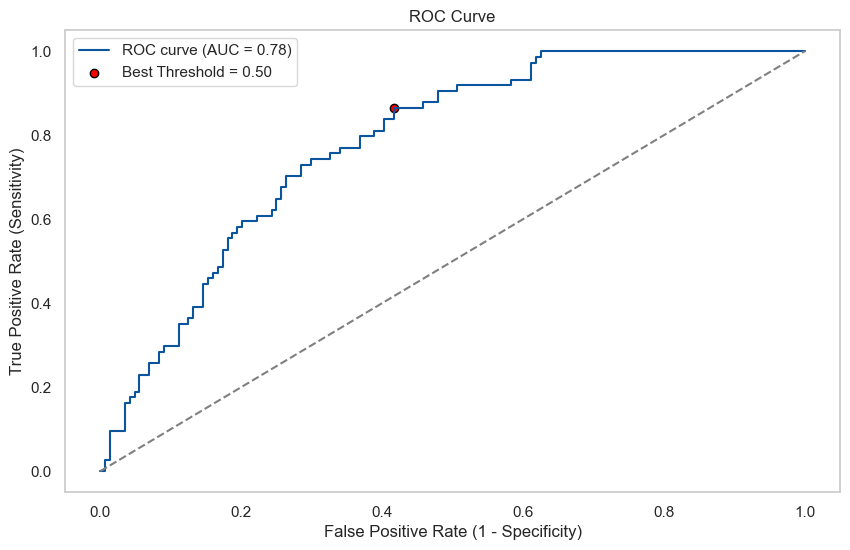

In [72]:
from sklearn.metrics import roc_curve, auc, f1_score

# Find the best threshold
best_threshold_index = np.argmax(f1_scores)
best_threshold = thresholds_roc[best_threshold_index]
best_fpr = fpr[best_threshold_index]
best_tpr = tpr[best_threshold_index]

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc(fpr, tpr):.2f})')

# Mark the best threshold with a red dot
plt.scatter([best_fpr], [best_tpr], c='red', label=f'Best Threshold = {best_threshold:.2f}', edgecolors='k')

# Plot details
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve')
plt.legend()
plt.grid()

plt.show()

# Now bring in Prediction Data and do same conversions as the I did with the Train Data.

In [73]:
X_holdout_test= pd.read_excel("recruiting_zeta-disease_prediction-data_take-home-challenge.xlsx")

In [74]:
X_holdout_test.drop(columns=['zeta_disease','years_smoking'],inplace=True)

In [75]:
X_holdout_test.shape

(20, 7)

In [76]:
# Apply log transformation
X_holdout_test['log_age'] = np.log(X_holdout_test['age'])
X_holdout_test['log_liver_stress_test'] = np.log(X_holdout_test['liver_stress_test'])
X_holdout_test['log_bmi'] = np.log(X_holdout_test['bmi'])
X_holdout_test['log_insulin_test_imputed'] = np.log(X_holdout_test['insulin_test'])

In [77]:
X_holdout_test.head()

,age,weight,bmi,blood_pressure,insulin_test,liver_stress_test,cardio_stress_test,log_age,log_liver_stress_test,log_bmi,log_insulin_test_imputed
0,24,151,39.5,69,72,1.3968,56,3.178054,0.334184,3.676301,4.276666
1,27,179,35.5,89,156,1.6608,43,3.295837,0.507299,3.569533,5.049856
2,34,147,26.9,76,74,1.6958,53,3.526361,0.528155,3.292126,4.304065
3,35,206,32.4,73,127,1.4608,61,3.555348,0.378984,3.478158,4.844187
4,60,193,29.8,62,192,1.7798,65,4.094345,0.576501,3.394508,5.257495


In [78]:
X_holdout_test.drop(columns=['age','bmi','insulin_test','liver_stress_test'],inplace=True)

In [79]:
X_holdout_test.head()

,weight,blood_pressure,cardio_stress_test,log_age,log_liver_stress_test,log_bmi,log_insulin_test_imputed
0,151,69,56,3.178054,0.334184,3.676301,4.276666
1,179,89,43,3.295837,0.507299,3.569533,5.049856
2,147,76,53,3.526361,0.528155,3.292126,4.304065
3,206,73,61,3.555348,0.378984,3.478158,4.844187
4,193,62,65,4.094345,0.576501,3.394508,5.257495


In [80]:
X_holdout_test_transformed = X_holdout_test[[
    'weight','cardio_stress_test',
    'log_age','log_liver_stress_test',
    'log_bmi','log_insulin_test_imputed']]

Renaming the cardio_stress_test to cardio_stress_test_imputed to match the name in the saved model file. 

In [81]:
X_holdout_test_transformed.rename(columns={'cardio_stress_test': 'cardio_stress_test_imputed'}, inplace=True)

C:\Users\brent\AppData\Local\Temp\ipykernel_26944\3214651507.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_holdout_test_transformed.rename(columns={'cardio_stress_test': 'cardio_stress_test_imputed'}, inplace=True)


In [82]:
column_order = X_train.columns
df_values = X_holdout_test_transformed[column_order]

# Transform the holdout test set using the fitted pipeline
X_holdout_test_final = best_model.named_steps['preprocessor'].transform(df_values)

In [83]:
X_holdout_test_final=pd.DataFrame(X_holdout_test_final,columns = column_order)

# Now make Prediction on this data

In [84]:
# Predict on the holdout test set
y_pred = best_model.predict(X_holdout_test_final)

In [85]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
      dtype=int64)